In [8]:
!pip install -q shapely folium

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

In [2]:
from pathlib import Path
import json
from random import randint
from collections import Counter
from collections import defaultdict

In [5]:
import json 
from PIL import Image, ImageDraw
from IPython.display import display
from shapely import wkt
from shapely.geometry.multipolygon import MultiPolygon

In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
from copy import copy 

%matplotlib inline
# figure size in inches optional
rcParams['figure.figsize'] = 30, 30
plt.rcParams['legend.title_fontsize'] = 14

In [9]:
# CODE FOR THIS CELL IS TAKEN FROM https://www.kaggle.com/alexisbcook/interactive-maps
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [10]:
# CODE FOR THIS CELL IS TAKEN FROM https://www.kaggle.com/alexisbcook/interactive-maps
# Function for displaying the map
def embed_map(m, file_name):
    from IPython.display import IFrame
    m.save(file_name)
    return IFrame(file_name, width='100%', height='500px')

In [11]:
# Fetch all post disaster json files
labels_generator = Path('../data').rglob(pattern=f'*post_*.json')

In [12]:
# Group json files by disaster
def get_disaster_dict(labels_generator):    
    disaster_dict = defaultdict(list)
    for label in labels_generator:
        disaster_type = label.name.split('_')[0]
        disaster_dict[disaster_type].append(str(label))
    return disaster_dict

In [13]:
disaster_dict = get_disaster_dict(labels_generator)

In [14]:
# List of Disasters present in the dataset
disaster_dict.keys()

dict_keys(['socal-fire', 'midwest-flooding', 'mexico-earthquake', 'hurricane-michael', 'santa-rosa-wildfire', 'palu-tsunami', 'hurricane-harvey', 'hurricane-matthew', 'hurricane-florence', 'guatemala-volcano'])

In [39]:
# Select a particular disaster
disaster_labels = disaster_dict['midwest-flooding']

In [16]:
def read_label(label_path):
    with open(label_path) as json_file:
        image_json = json.load(json_file)
        return image_json

In [17]:
# Color codes for polygons
damage_dict = {
    "no-damage": (0, 255, 0, 50),
    "minor-damage": (0, 0, 255, 50),
    "major-damage": (255, 69, 0, 50),
    "destroyed": (255, 0, 0, 50),
    "un-classified": (255, 255, 255, 50)
}

In [18]:
def get_damage_type(properties):
    if 'subtype' in properties:
        return properties['subtype']
    else:
        return 'no-damage'

In [19]:
def annotate_img(draw, coords):
        wkt_polygons = []

        for coord in coords:
            damage = get_damage_type(coord['properties'])
            wkt_polygons.append((damage, coord['wkt']))

        polygons = []

        for damage, swkt in wkt_polygons:
            polygons.append((damage, wkt.loads(swkt)))

        for damage, polygon in polygons:
            x,y = polygon.exterior.coords.xy
            coords = list(zip(x,y))
            draw.polygon(coords, damage_dict[damage])

        del draw

In [20]:
def display_img(json_path, time='post', annotated=True):
    if time=='pre':
        json_path = json_path.replace('post', 'pre')
        
    img_path = json_path.replace('labels', 'images').replace('json','png')
        
    image_json = read_label(json_path)
    img_name = image_json['metadata']['img_name']
        
    print(img_name)
    
    img = Image.open(img_path)
    draw = ImageDraw.Draw(img, 'RGBA')
    
    if annotated:
        annotate_img(draw, image_json['features']['xy'])

    return img

In [21]:
def plot_image(label):

    # read images
    img_A = display_img(label, time='pre', annotated=False)
    img_B = display_img(label, time='post', annotated=False)
    img_C = display_img(label, time='pre', annotated=True)
    img_D = display_img(label, time='post', annotated=True)


    # display images
    fig, ax = plt.subplots(2,2)
    fig.set_size_inches(30, 30)
    TITLE_FONT_SIZE = 24
    ax[0][0].imshow(img_A);
    ax[0][0].set_title('Pre Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[0][1].imshow(img_B);
    ax[0][1].set_title('Post Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][0].imshow(img_C);
    ax[1][0].set_title('Pre Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][1].imshow(img_D);
    ax[1][1].set_title('Post Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    plt.savefig('split_image.png', dpi = 100)
    plt.show()

In [28]:
disaster_labels[1]

'../data/train/labels/midwest-flooding_00000172_post_disaster.json'

socal-fire_00001292_post_disaster.png


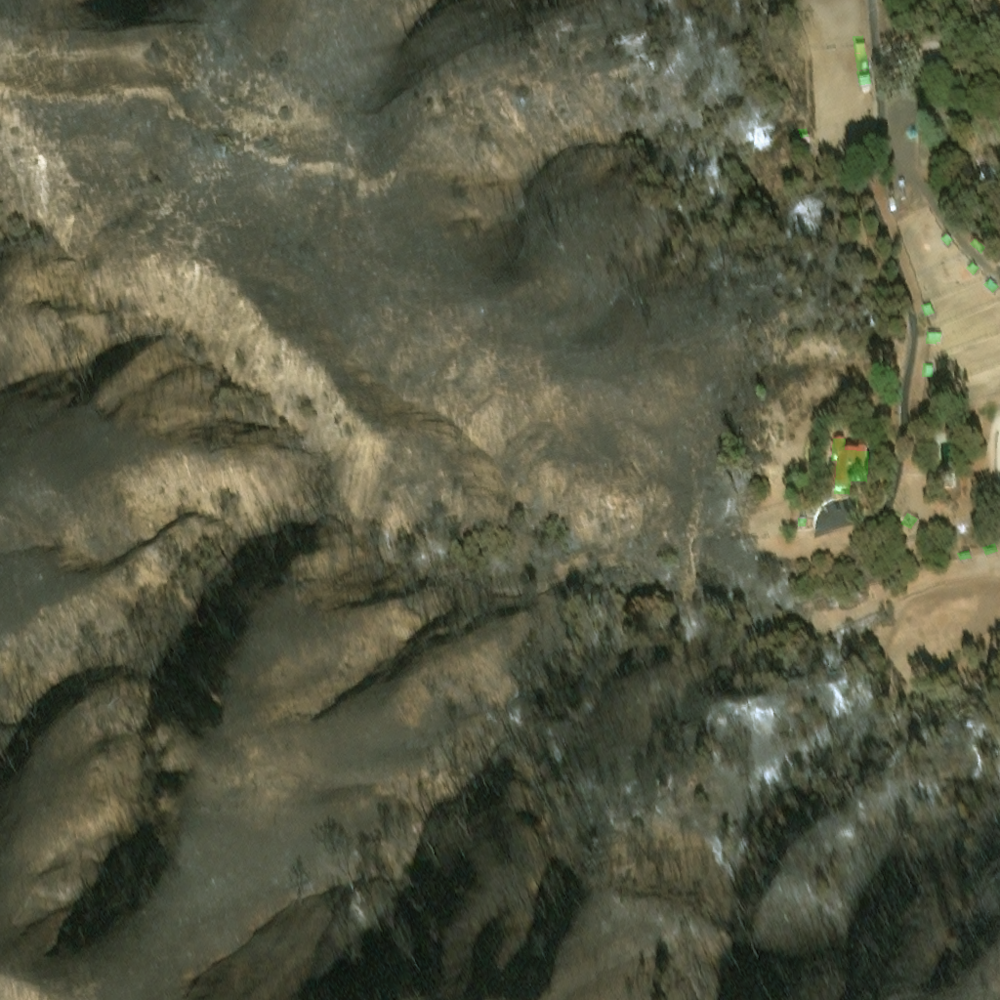

In [37]:
# Display a single image using label path. 
# `time` argument shows post or pre disaster images
# `annotated` argument labels images
display_img(disaster_labels[1], time='post', annotated=True)

In [29]:
# Get polygons center coords (lat, long)
def get_centroid(coords):
    polygons = [ wkt.loads(polygon['wkt']) for polygon in coords ]
    centroid =  MultiPolygon(polygons).centroid
    try:
        return {'centroid_x': centroid.x, 'centroid_y': centroid.y, 'latlong': centroid }
    except IndexError as e:
        return {'centroid_x': None, 'centroid_y': None, 'latlong': None }

In [30]:
def get_damage_dict(coords):
    damage_list = [ get_damage_type(coord['properties']) for coord in coords]
    return Counter(damage_list)

In [54]:
# Add centroid and damage dict to metadata
def metadata_with_damage(label_path):
    data = read_label(label_path)
    coords = data['features']['lng_lat']
    
    damage_dict = get_damage_dict(coords)
    

    if coords:
        centroid = get_centroid(coords)
        
        data['metadata'].update(centroid)
        data['metadata']['path'] = label_path
        data['metadata'].update(damage_dict)
        return data['metadata']
    else:
        return None

In [57]:
def generate_metadata_df(disaster_labels):
    metadata_list = [metadata_with_damage(label_path) for label_path in disaster_labels]
    # Optionally, filter out None values if you have them:
    metadata_list = [md for md in metadata_list if md is not None]
    
    df = pd.DataFrame(metadata_list)
    # Compute means only for numeric columns
    numeric_means = df.mean(numeric_only=True)
    return df.fillna(numeric_means)


In [58]:
# Sort df by destroyed count
df = generate_metadata_df(disaster_labels)
sorted_df = df.sort_values(by=['destroyed'], ascending=False)

In [59]:
sorted_df

,sensor,provider_asset_type,gsd,capture_date,off_nadir_angle,pan_resolution,sun_azimuth,sun_elevation,target_azimuth,disaster,...,img_name,centroid_x,centroid_y,latlong,path,no-damage,minor-damage,un-classified,major-damage,destroyed
183,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.252460,2019-05-30T17:35:04.000Z,7.110581,0.313106,140.675550,72.39723,2.891011,midwest-flooding,...,midwest-flooding_00000435_post_disaster.png,-96.341887,36.117893,POINT (-96.3418867006856 36.117893111824536),../data/train/labels/midwest-flooding_00000435...,61.000000,1.986667,4.130435,2.767442,7.0
234,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.252460,2019-05-30T17:35:04.000Z,7.110581,0.313106,140.675550,72.39723,2.891011,midwest-flooding,...,midwest-flooding_00000143_post_disaster.png,-96.339259,36.214644,POINT (-96.33925886452694 36.214644275581),../data/train/labels/midwest-flooding_00000143...,13.000000,3.000000,4.130435,1.000000,6.0
94,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.252460,2019-05-30T17:35:04.000Z,7.110581,0.313106,140.675550,72.39723,2.891011,midwest-flooding,...,midwest-flooding_00000340_post_disaster.png,-96.277221,36.141787,POINT (-96.27722116206972 36.141787376245354),../data/train/labels/midwest-flooding_00000340...,36.945455,5.000000,4.130435,13.000000,6.0
102,GEOEYE01,GEOEYE01,1.739208,2019-05-31T16:54:31.000Z,15.354399,0.434699,123.605255,69.66407,265.267580,midwest-flooding,...,midwest-flooding_00000002_post_disaster.png,-92.346312,34.785621,POINT (-92.3463122378759 34.78562104394992),../data/train/labels/midwest-flooding_00000002...,6.000000,1.986667,4.130435,1.000000,4.0
161,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.252460,2019-05-30T17:35:04.000Z,7.110581,0.313106,140.675550,72.39723,2.891011,midwest-flooding,...,midwest-flooding_00000301_post_disaster.png,-96.373441,36.184403,POINT (-96.37344142868214 36.184402769500004),../data/train/labels/midwest-flooding_00000301...,69.000000,1.986667,1.000000,2.767442,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.252460,2019-05-30T17:35:04.000Z,7.110581,0.313106,140.675550,72.39723,2.891011,midwest-flooding,...,midwest-flooding_00000404_post_disaster.png,-96.273411,35.957901,POINT (-96.27341140094312 35.95790148483252),../data/train/labels/midwest-flooding_00000404...,9.000000,1.986667,4.130435,2.767442,1.0
93,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.252460,2019-05-30T17:35:04.000Z,7.110581,0.313106,140.675550,72.39723,2.891011,midwest-flooding,...,midwest-flooding_00000276_post_disaster.png,-96.349364,36.124480,POINT (-96.34936354300046 36.124480209218774),../data/train/labels/midwest-flooding_00000276...,12.000000,2.000000,4.130435,2.000000,1.0
206,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.252460,2019-05-30T17:35:04.000Z,7.110581,0.313106,140.675550,72.39723,2.891011,midwest-flooding,...,midwest-flooding_00000317_post_disaster.png,-96.326915,36.183825,POINT (-96.32691474102336 36.1838245911658),../data/train/labels/midwest-flooding_00000317...,36.945455,1.986667,4.130435,2.767442,1.0
147,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.252460,2019-05-30T17:35:04.000Z,7.110581,0.313106,140.675550,72.39723,2.891011,midwest-flooding,...,midwest-flooding_00000168_post_disaster.png,-96.278031,36.236132,POINT (-96.27803112944012 36.23613212557356),../data/train/labels/midwest-flooding_00000168...,36.945455,1.986667,4.130435,2.767442,1.0


In [60]:
df_generator = sorted_df.iterrows()

In [61]:
# Generate Google Maps link to location
from IPython.core.display import display, HTML
def generate_gmaps_link(lat, long):
    link = f"https://www.google.com/maps/@?api=1&map_action=map&center={lat},{long}&zoom=18&basemap=satellite"
    return HTML(f"""<a href="{link}" target="_blank">{link}</a>""")

/var/folders/p1/vj5nk3dj08nbdgjg1lst8k_w0000gn/T/ipykernel_14932/3452365405.py:2: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython.display
  from IPython.core.display import display, HTML


In [62]:
# fetch first row (most damaged location)
index, row = next(df_generator)

In [63]:
# provides google maps link
generate_gmaps_link(row.centroid_y, row.centroid_x)

In [64]:
# Shows damage polygon counts for image
row[['no-damage', 'minor-damage', 'major-damage', 'destroyed', 'un-classified']]

no-damage            61.0
minor-damage     1.986667
major-damage     2.767442
destroyed             7.0
un-classified    4.130435
Name: 183, dtype: object

midwest-flooding_00000435_pre_disaster.png


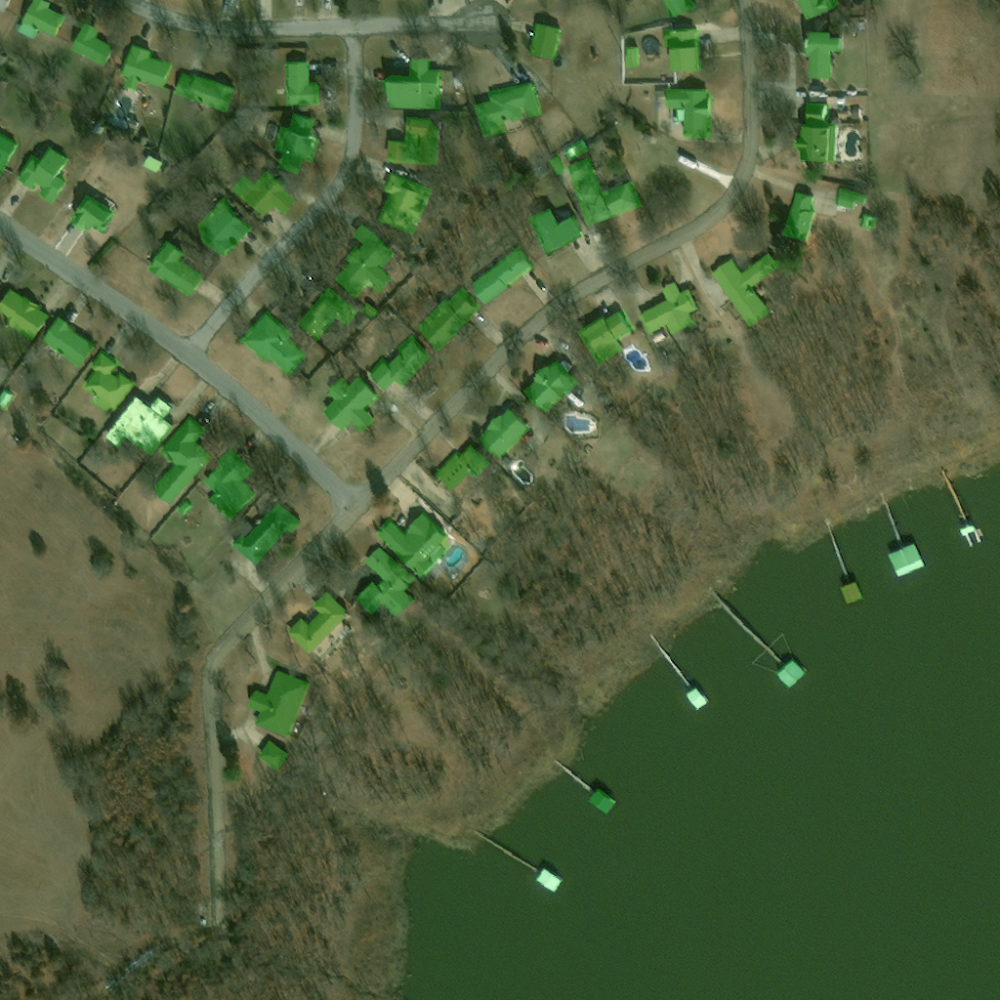

In [65]:
# shows pre disaster image
display_img(row.path, time='pre', annotated=True)

midwest-flooding_00000435_post_disaster.png


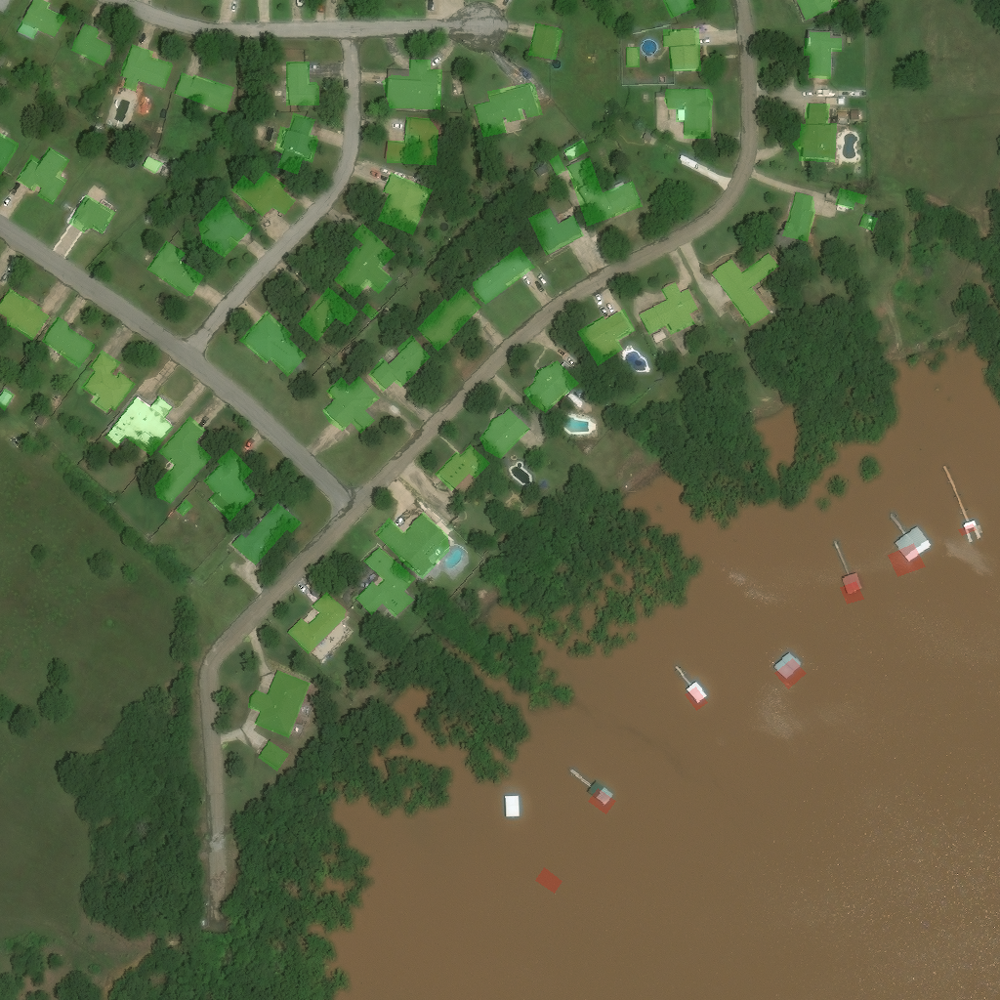

In [66]:
# shows post disaster image
display_img(row.path, time='post', annotated=True)

midwest-flooding_00000435_pre_disaster.png
midwest-flooding_00000435_post_disaster.png
midwest-flooding_00000435_pre_disaster.png
midwest-flooding_00000435_post_disaster.png


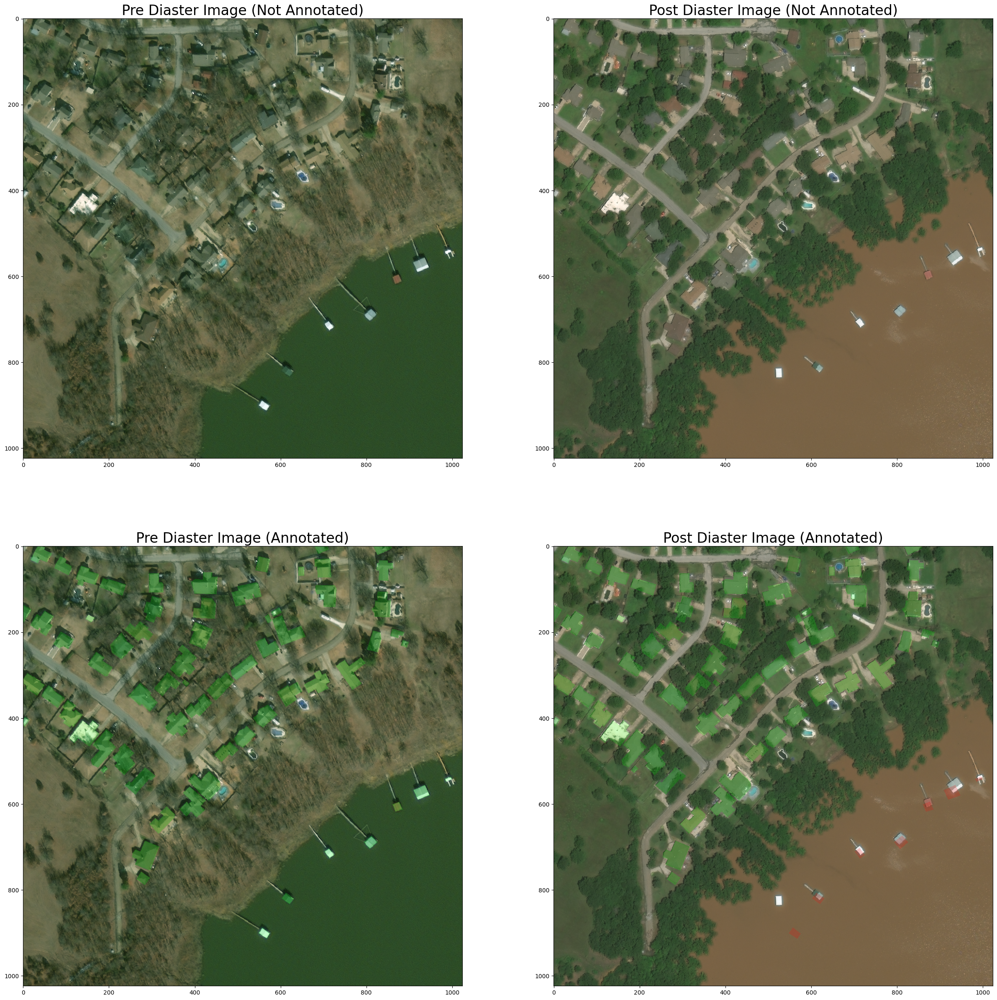

In [67]:
# plots pre and post disaster images with annotations
plot_image(row.path)

**Damaged Locations on Map**

This Map displays the affected locations by their damage type

In [68]:
def generate_circle(row):
    
    COLOR_MAP = {
        "no-damage": 'green',
        "minor-damage": 'blue',
        "major-damage": '#ffff00',
        "destroyed": 'red',
        "un-classified": 'black'
    }
    
    for damage_type, color in COLOR_MAP.items():
        yield Circle(
            location=row.loc[['centroid_y','centroid_x']].tolist(),
            radius=row.loc[damage_type],
            color=color)

In [70]:
location = df.mean(numeric_only=True).loc[['centroid_y','centroid_x']].tolist()

In [71]:
# CODE FOR THIS CELL IS TAKEN FROM https://www.kaggle.com/alexisbcook/interactive-maps

# mean latitude and longitude
# Create a map
m_2 = folium.Map(location=location, tiles='openstreetmap', zoom_start=13)

# Add points to the map
for idx, row in df.iterrows():
    generator = generate_circle(row)
    for circle in generator:
        circle.add_to(m_2)

# Display the map
embed_map(m_2, 'm_2.html')

In [76]:
labels_generator = Path('../data').rglob(pattern=f'*.json')
full_df = generate_metadata_df(labels_generator)

In [86]:
def plot_bargraph(df, x, y, agg_func):
    # Group by the x column and aggregate the y column using the given agg_func.
    new_df = df.groupby(x, as_index=False).agg({y: agg_func})
    new_df = new_df.sort_values(by=y, ascending=False)
    
    for index, row in new_df.iterrows():
        plt.bar(row[x], row[y], label=row.disaster, align='center')
        
    # Add labels, title, and adjust tick properties.
    plt.xlabel(x, fontsize=22)
    plt.ylabel(f'{agg_func} of {y}', fontsize=22)
    plt.title(f'{agg_func.capitalize()} {y} by {x}', fontsize=26)
    plt.xticks(fontsize=22, rotation=90)
    
    # Optionally, if you want to show a legend you can add one:
    # plt.legend(title=x, fontsize=18)
    
    # Adjust the figure size.
    fig = plt.gcf()
    fig.set_size_inches(30, 30)
    
    # Save and show the plot.
    plt.savefig(f'{agg_func}.png', dpi=100)
    plt.show()


**Mean GSD by grouped by Disater**

The Ground Sampling Distance will help us get an idea on the spatial resolution of the images per disaster. This has help us normalize the images to a specific resolution during training.

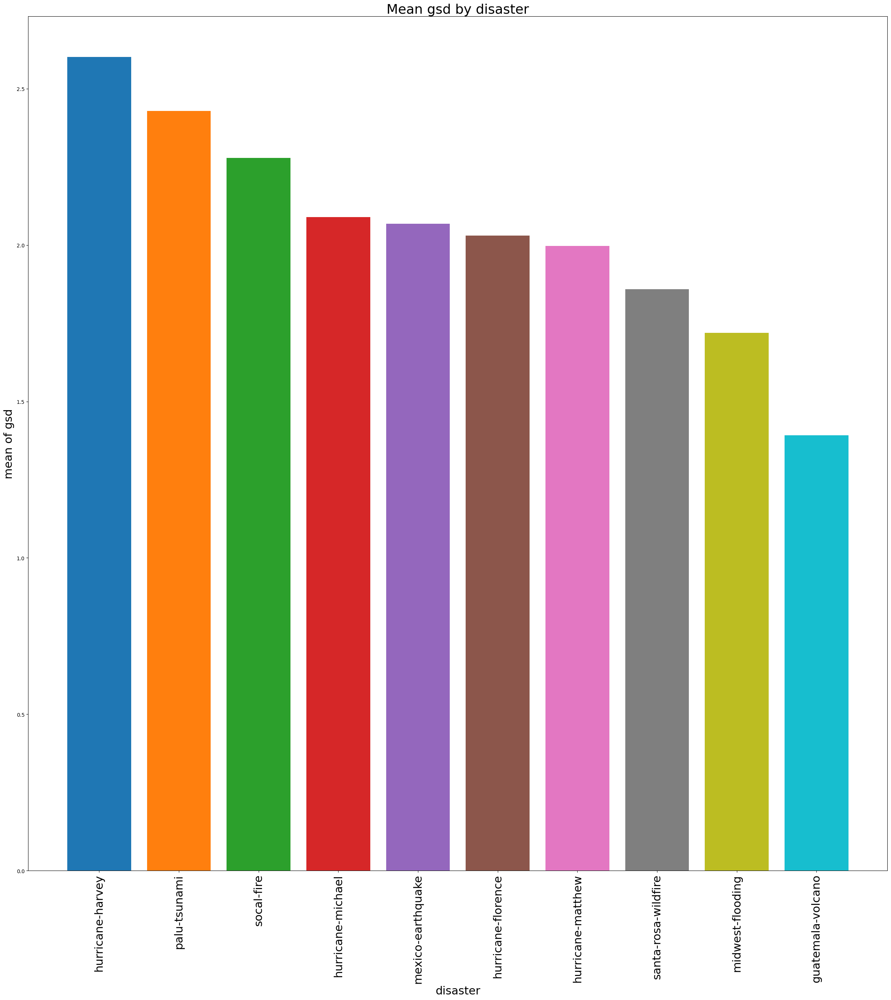

In [87]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='mean')

In [88]:
# Mean GSD for dataset
full_df['gsd'].mean()

2.121842717170455

**Number of images per Disaster**

The number of datapoints per dataset will give us an idea on which disaster to focus on while training our model.

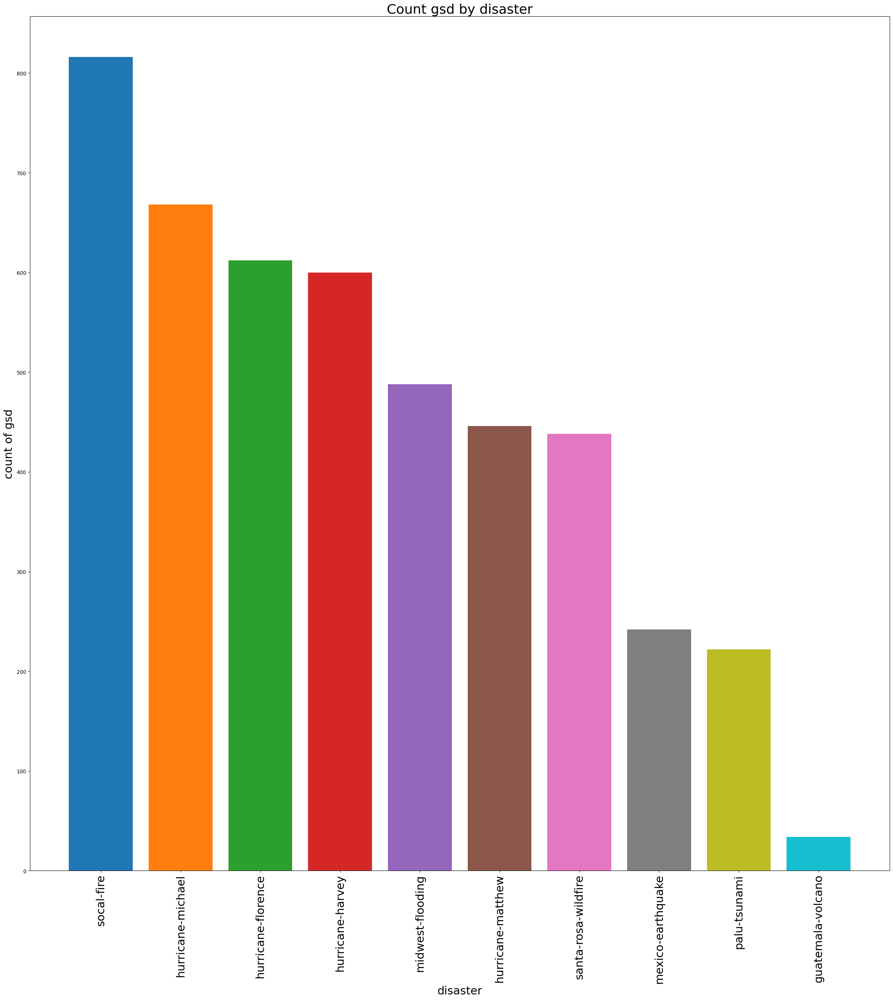

In [89]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='count')